# Introduction

Agricultural growth depends on various soil parameters, namely nitrogen, phosphorus, potassium, crop rotation, soil moisture, surface temperature, and also on weather aspects such as temperature, rainfall, etc. The rapid progress towards technical development will prove to be beneficial to agriculture and increase crop productivity, resulting in better yields for farmers.

The proposed project offers a solution for Smart Agriculture by monitoring agricultural fields, which can assist farmers in significantly increasing productivity. The data used in this project is obtained from the GitHub repository (https://github.com/nikhilkeshava) containing Indian data, including temperature, rainfall, and soil parameters.

This repository provides insights into which crops are suitable to be cultivated in a particular area. Our objective in this example is to determine a performance model that forecasts crop yield based on machine learning regression models.

# Import the necessary libraries

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import norm
import missingno as msno

from scipy import stats # Outliers
from statsmodels.stats.outliers_influence import variance_inflation_factor  # Collinearity
from sklearn.model_selection import train_test_split # Spliting data
from sklearn.preprocessing import LabelEncoder # Data transformation

from sklearn.preprocessing import MinMaxScaler # Scaling data

from sklearn.feature_selection import SelectKBest, f_regression # Feature selection

# Machine learning models
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from sklearn.linear_model import BayesianRidge
from sklearn.metrics import mean_squared_error



# Import data

In [5]:
!git clone https://github.com/nikhilkeshava/crop-yield-prediction-using-AI-and-ml

fatal: destination path 'crop-yield-prediction-using-AI-and-ml' already exists and is not an empty directory.


In [6]:
cd crop-yield-prediction-using-AI-and-ml

/content/crop-yield-prediction-using-AI-and-ml


In [7]:
data = pd.read_excel('crop_csv_file.xlsx')

In [ ]:
# Or using :
from google.colab import files
file = files.upload()

# Data understand

## Data sheet

In [ ]:
data.head(3)

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,humidity,soil moisture,area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,36,35,45,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,37,40,46,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.0


## Data Info

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49999 entries, 0 to 49998
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   State_Name     49999 non-null  object 
 1   District_Name  49999 non-null  object 
 2   Crop_Year      49999 non-null  int64  
 3   Season         49999 non-null  object 
 4   Crop           49999 non-null  object 
 5   Temperature    49999 non-null  int64  
 6   humidity       49999 non-null  int64  
 7   soil moisture  49999 non-null  int64  
 8    area          49999 non-null  float64
 9   Production     49784 non-null  float64
dtypes: float64(2), int64(4), object(4)
memory usage: 3.8+ MB


## Data describe (descriptive statistics)

In [ ]:
data.describe()

,Crop_Year,Temperature,humidity,soil moisture,area,Production
count,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,4.978400e+04
mean,2005.879138,34.445489,44.776116,53.110502,7363.389469,4.132019e+05
std,5.106092,3.498524,6.662406,5.258764,27927.935789,1.232609e+07
min,1997.000000,25.000000,35.000000,45.000000,0.200000,0.000000e+00
25%,2002.000000,34.000000,40.000000,50.000000,76.000000,8.700000e+01
50%,2006.000000,36.000000,42.000000,54.000000,436.000000,6.384400e+02
75%,2010.000000,36.000000,50.000000,55.000000,2546.500000,5.615000e+03
max,2014.000000,37.000000,55.000000,62.000000,877029.000000,7.801620e+08


## Data Vis

In [8]:
Qual_Columns = ['State_Name', 'District_Name', 'Season', 'Crop']
Quant_Columns = ['Crop_Year', 'Temperature', 'humidity', 'soil moisture', ' area', 'Production']

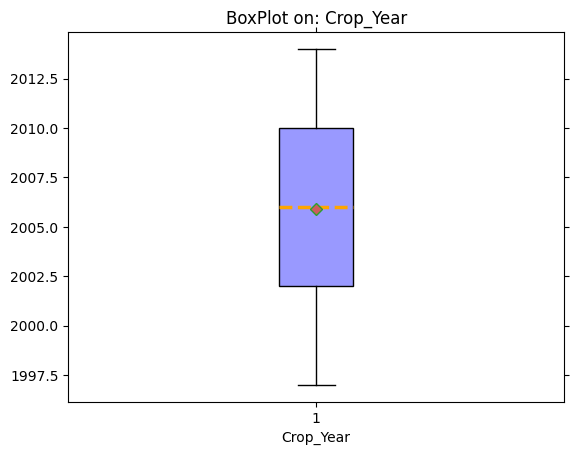

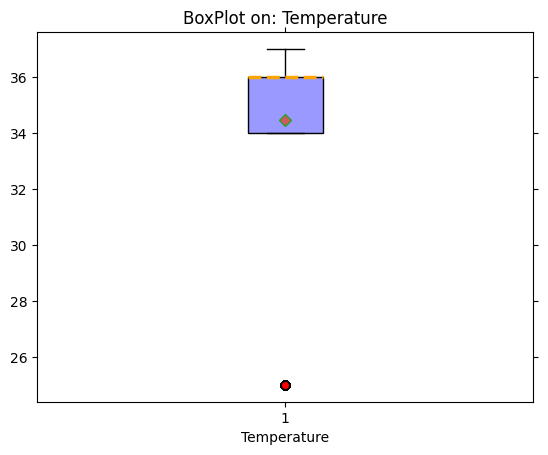

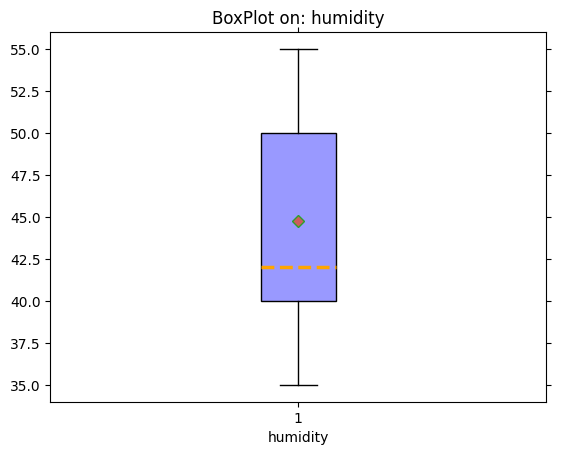

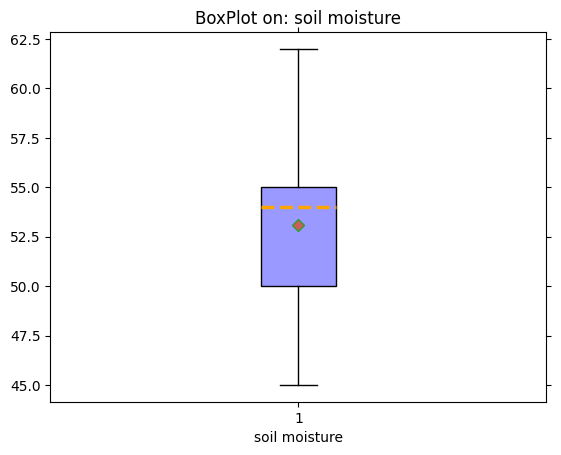

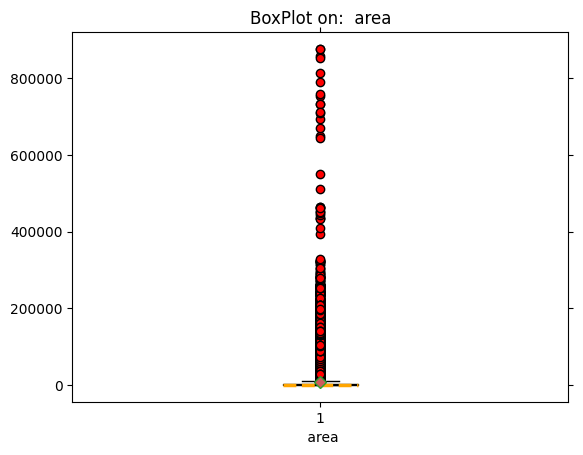

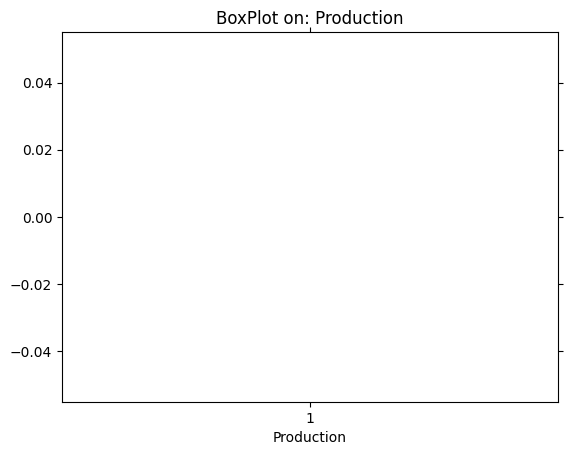

In [6]:
# Iterate over each column in Quant_Columns
for column in Quant_Columns:
    plt.boxplot(x=data[column],
                whis=3,
                patch_artist=True,
                showmeans=True,
                boxprops={'color': 'black', 'facecolor': '#9999ff'},
                flierprops={'marker': 'o', 'markerfacecolor': 'red', 'color': 'black'},
                meanprops={'marker': 'D', 'markerfacecolor': 'indianred'},
                medianprops={'linestyle': '--', 'linewidth': 2.5, 'color': 'orange'})

    plt.tick_params(top='off', right='off')
    plt.xlabel(column)  # Set xlabel to the current column name
    plt.title(f"BoxPlot on: {column}")
    plt.show()

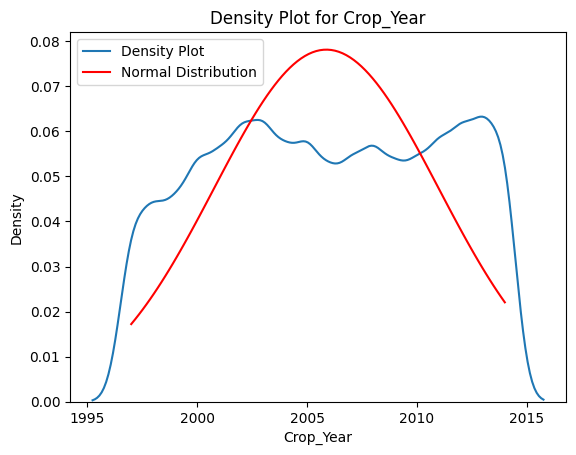

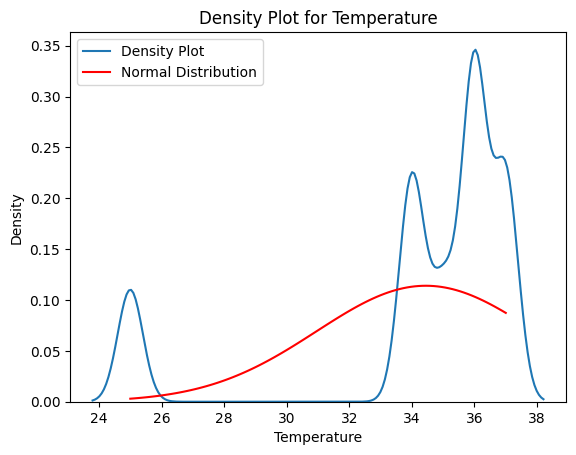

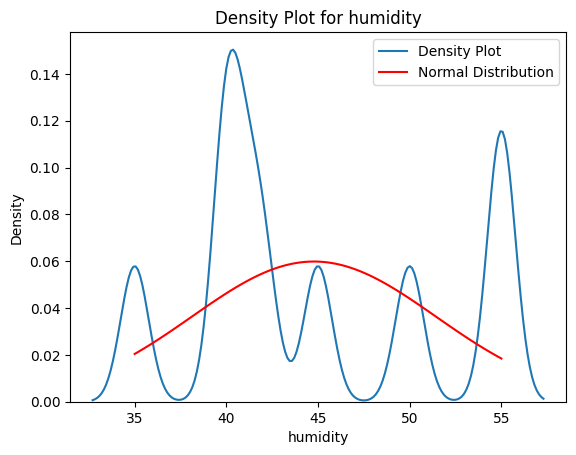

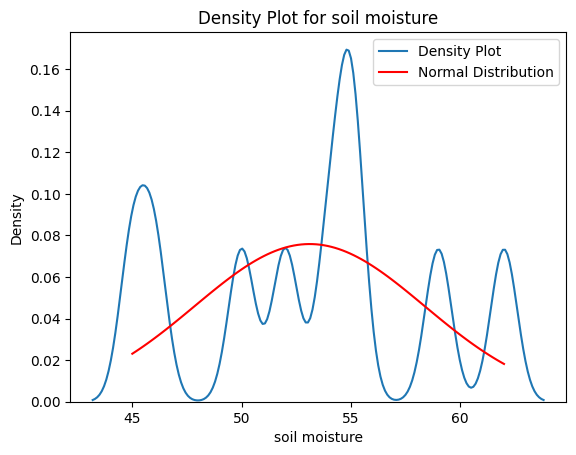

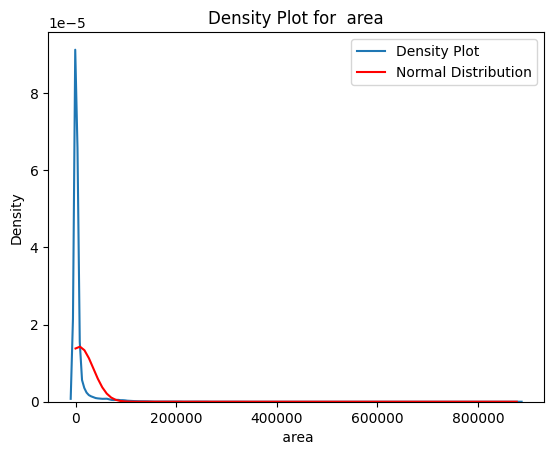

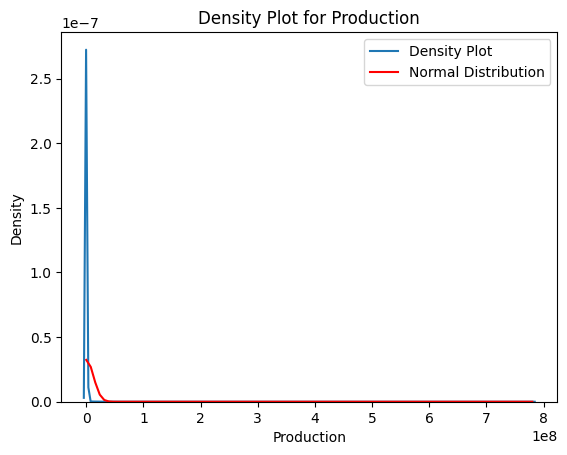

In [ ]:
# Iterate over each column in Quant_Columns
for column in Quant_Columns:
    # Get the cleaned data (exclude non-finite values)
    cleaned_data = data[column]
    cleaned_data = cleaned_data[np.isfinite(cleaned_data)]

    # Calculate parameters of the normal distribution (mean and standard deviation)
    mean, std = norm.fit(cleaned_data)

    # Generate a sample of values for the probability density function of the normal distribution
    x = np.linspace(cleaned_data.min(), cleaned_data.max(), 100)
    y = norm.pdf(x, mean, std)

    # Plot the density plot with the normal distribution
    plt.figure()
    sns.kdeplot(data=cleaned_data, label="Density Plot")
    plt.plot(x, y, 'r-', label="Normal Distribution")
    plt.xlabel(column)
    plt.ylabel("Density")
    plt.legend()
    plt.title(f'Density Plot for {column}')
    plt.show()

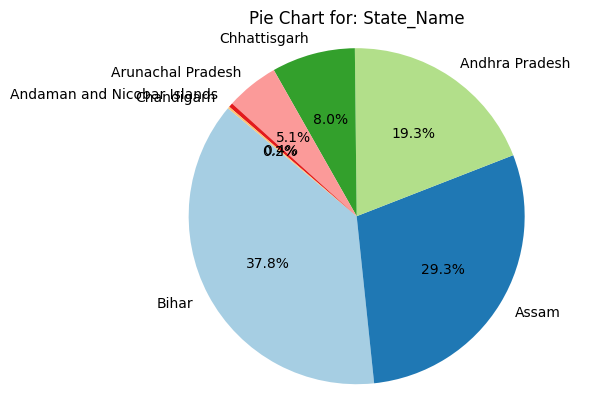

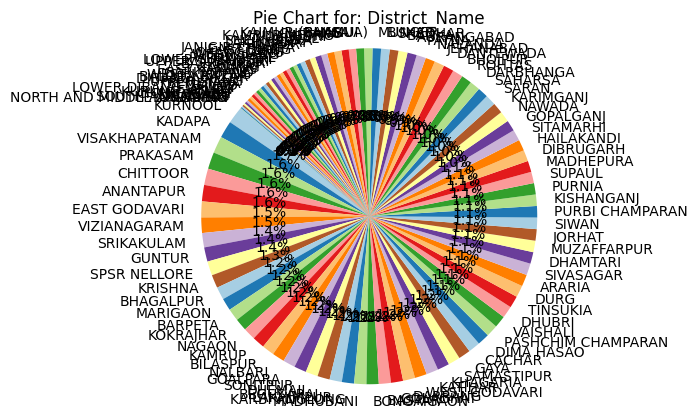

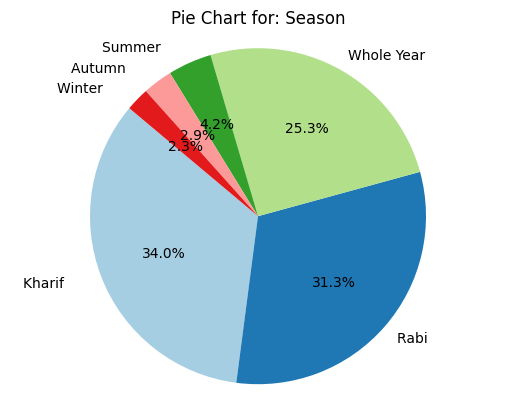

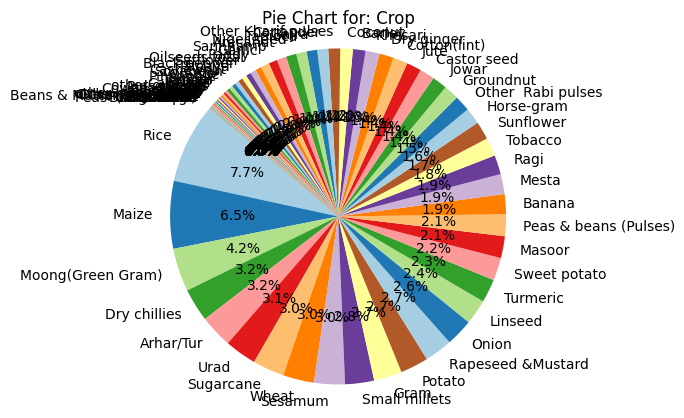

In [ ]:
# Iterate over each column in Qual_Columns
for column in Qual_Columns:
    # Get value counts for the column
    value_counts = data[column].value_counts()
    labels = value_counts.index
    sizes = value_counts.values

    # Plot the pie chart
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
    plt.title(f"Pie Chart for: {column}")
    plt.show()

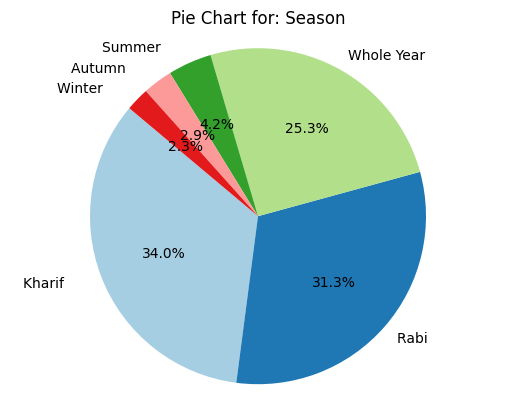

In [ ]:
value_counts = data['Season'].value_counts()
labels = value_counts.index
sizes = value_counts.values

plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Pie Chart for: Season")
plt.show()

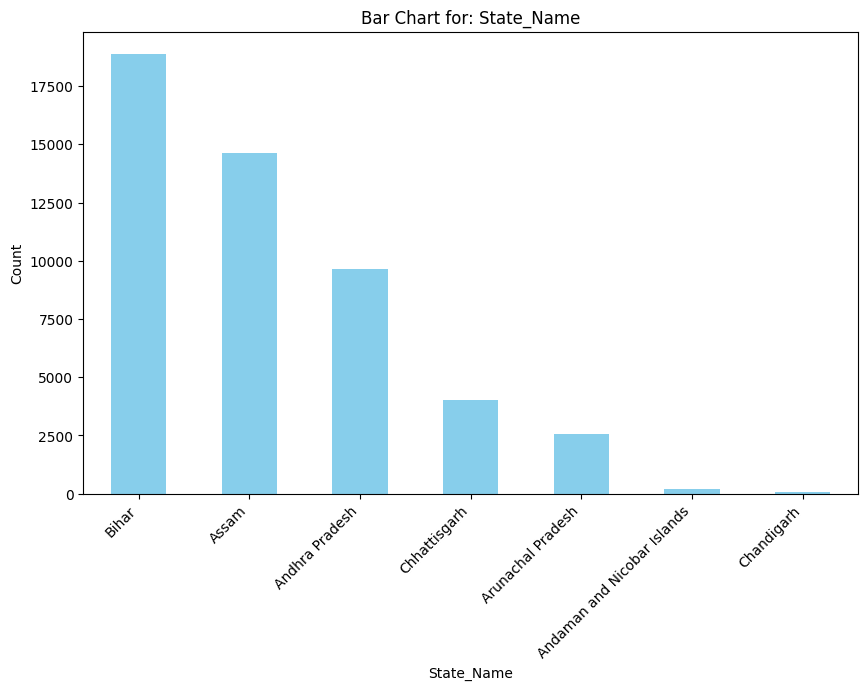

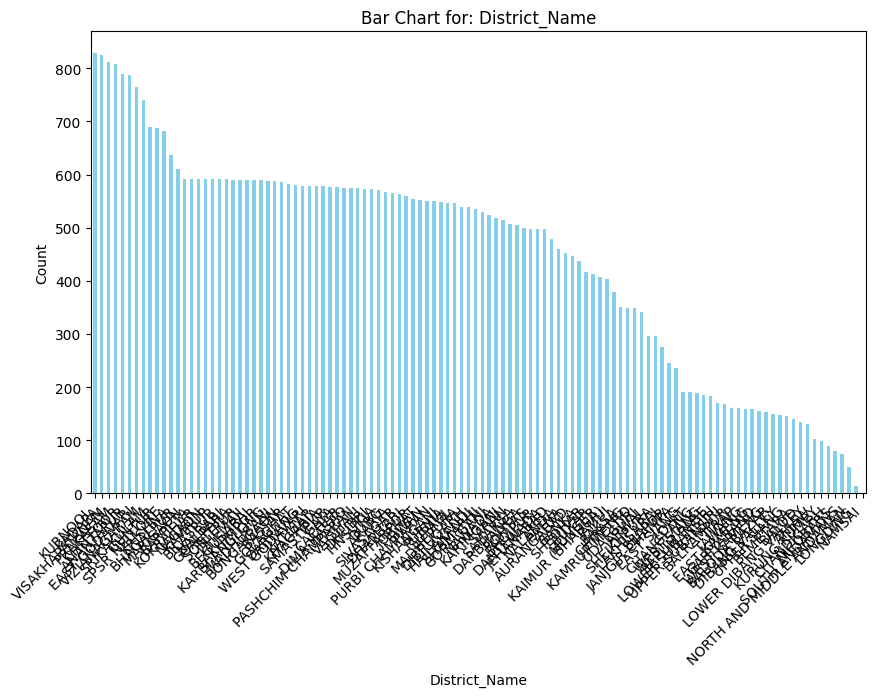

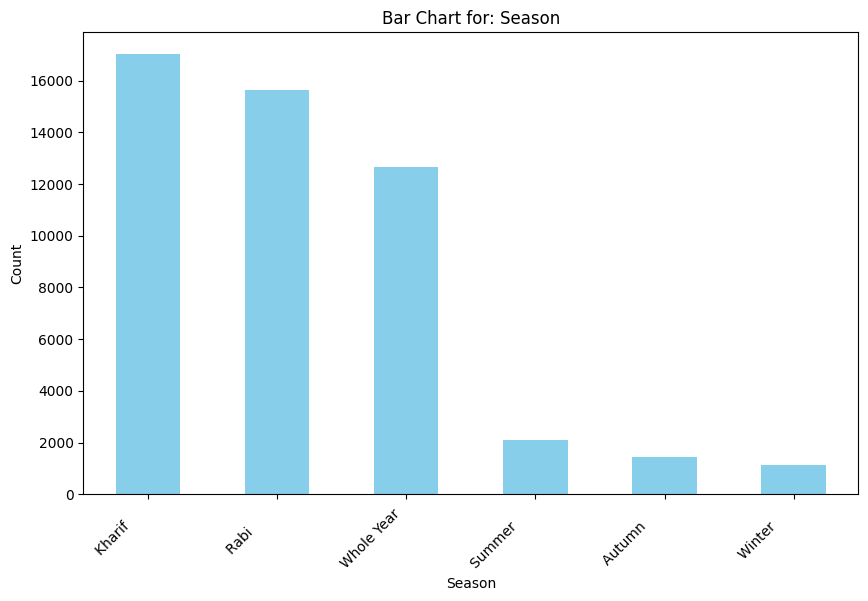

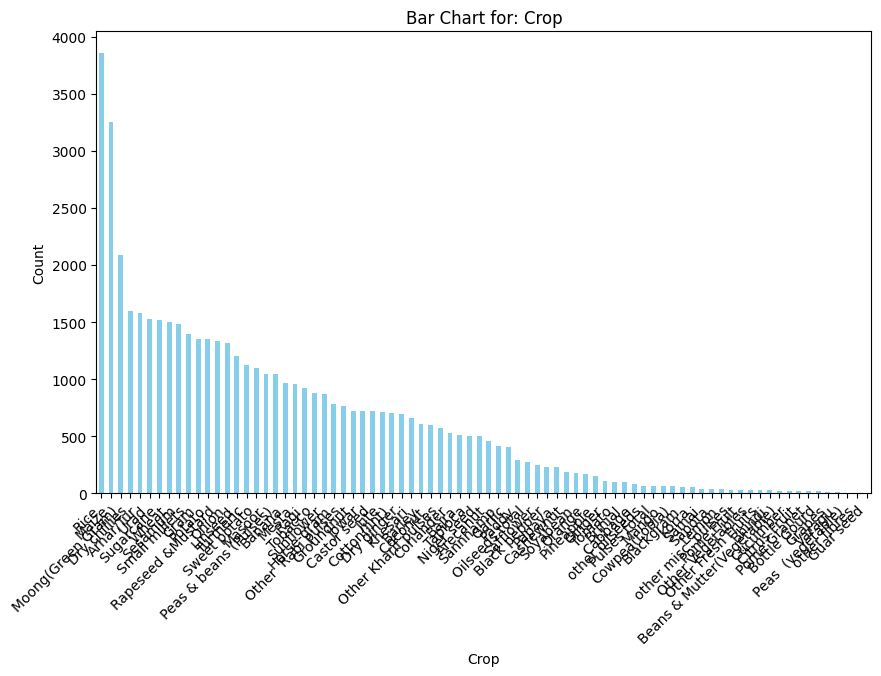

In [ ]:
# Iterate over each column in Qual_Columns
for column in Qual_Columns:
    # Get value counts for the column
    value_counts = data[column].value_counts()

    # Plot the bar chart
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    value_counts.plot(kind='bar', color='skyblue')

    plt.xlabel(column)
    plt.ylabel('Count')
    plt.title(f"Bar Chart for: {column}")
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.show()

# Data processing

## Missing Value

In [ ]:
# Calculate the percentage of missing values for each column
missing_percent = (data.isnull().sum() / len(data)) * 100

In [ ]:
missing_percent

State_Name       0.000000
District_Name    0.000000
Crop_Year        0.000000
Season           0.000000
Crop             0.000000
Temperature      0.000000
humidity         0.000000
soil moisture    0.000000
 area            0.000000
Production       0.430009
dtype: float64

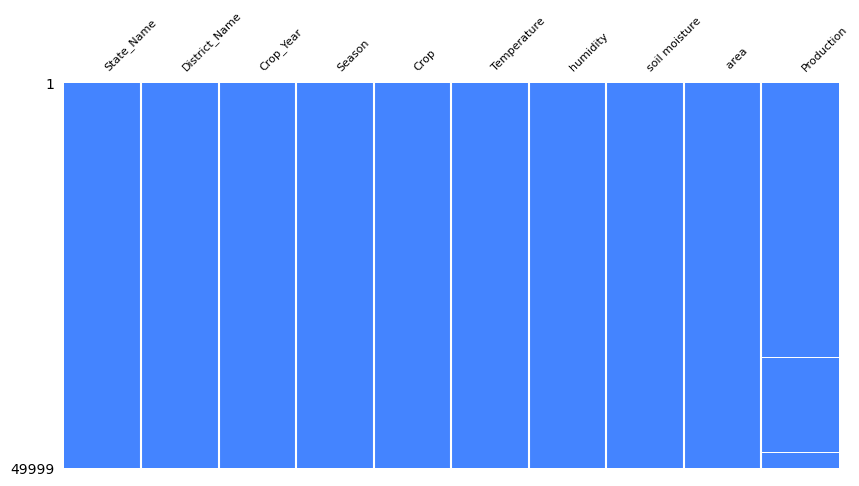

In [ ]:
# Visualize missing values
msno.matrix(data, sparkline=False, figsize=(10, 5), fontsize=8, color=(0.27, 0.52, 1.0))
plt.show()

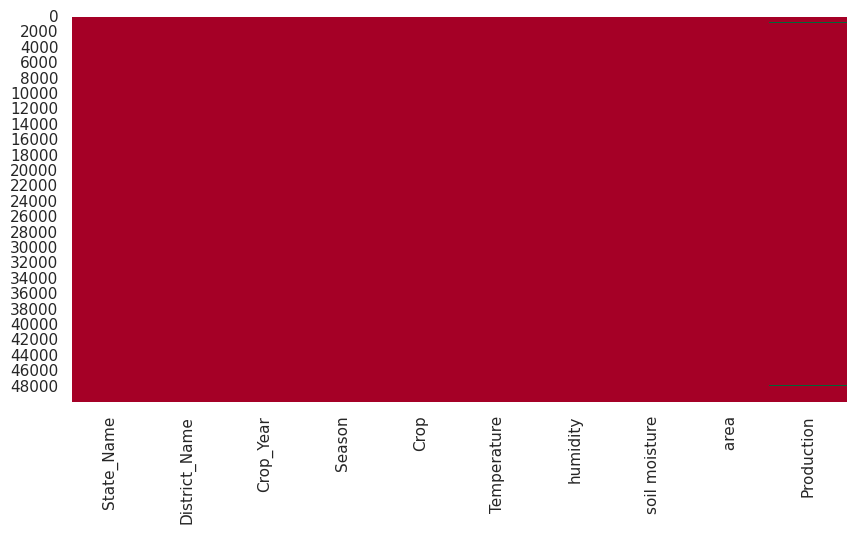

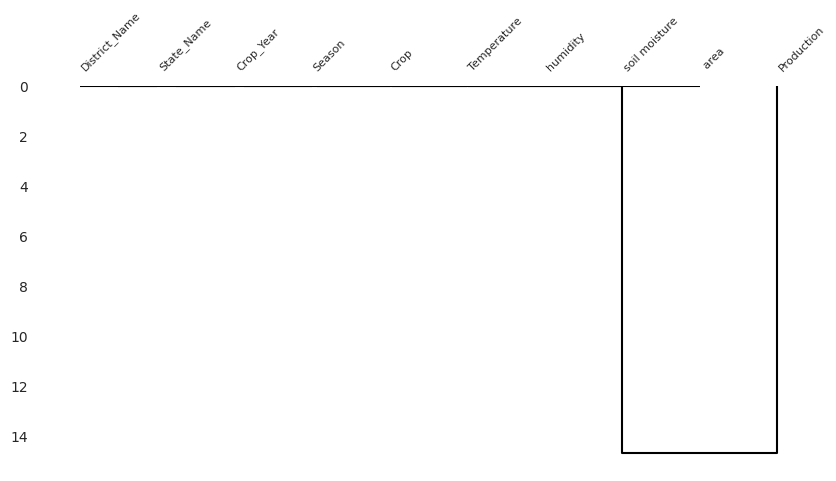

In [ ]:
sns.set(style="white")
plt.figure(figsize=(10, 5))
sns.heatmap(data.isnull(), cmap="RdYlGn", cbar=False)
plt.show()

msno.dendrogram(data, figsize=(10, 5), fontsize=8)
plt.show()

Handling missing data:

We observe a 43% missing value for the target variable "Production." The decision made is to delete observations with missing values.

In [9]:
# Drop rows with missing values
data_cleaned = data.dropna()

## Outliers

In [10]:
# Assuming you have already defined data_1 and Quant_Columns
data_1  = data_cleaned[Quant_Columns]
# Define a threshold for outliers (e.g., 1.5 times the IQR)
outlier_threshold = 1.5

# Create a mask for outliers based on the IQR method for each quantitative column
outlier_mask = pd.DataFrame()

for column in Quant_Columns:
    # Find the first quartile (Q1) and third quartile (Q3)
    q1 = data_1[column].quantile(0.25)
    q3 = data_1[column].quantile(0.75)

    # Calculate the IQR
    iqr = q3 - q1

    # Define the lower and upper bounds for outliers
    lower_bound = q1 - outlier_threshold * iqr
    upper_bound = q3 + outlier_threshold * iqr

    # Create a mask for outliers using the bounds
    column_outliers = (data_1[column] < lower_bound) | (data_1[column] > upper_bound)
    outlier_mask[column] = column_outliers

# Combine outlier masks for all columns
combined_outlier_mask = outlier_mask.any(axis=1)

# Remove rows containing outliers
data_no_outliers = data_cleaned[~combined_outlier_mask]

# Print the cleaned DataFrame
print("Original DataFrame:")
print(data_1)
print("\nDataFrame after removing outliers:")
print(data_no_outliers)

Original DataFrame:
       Crop_Year  Temperature  humidity  soil moisture    area  Production
0           2000           36        35             45  1254.0      2000.0
1           2000           37        40             46     2.0         1.0
2           2000           36        41             50   102.0       321.0
3           2000           37        42             55   176.0       641.0
4           2000           36        40             54   720.0       165.0
...          ...          ...       ...            ...     ...         ...
49994       2006           36        35             45    27.0         7.0
49995       2006           37        40             46    27.0        32.0
49996       2006           36        41             50   450.0       213.0
49997       2006           37        42             55  1778.0       309.0
49998       2006           36        40             54   216.0       194.0

[49784 rows x 6 columns]

DataFrame after removing outliers:
                  

In [ ]:
# Or :
# Assuming you have already defined data_1 and Quant_Columns
data_1  = data_cleaned[Quant_Columns]
# Define a threshold for the Z-score beyond which a point is considered an outlier
z_threshold = 9
# Calculate the Z-scores
z_scores = np.abs(stats.zscore(data_1))
# Identify outliers based on the Z-scores
outliers = np.where(z_scores > z_threshold)[0]
# Remove rows containing outliers
data_no_outliers = data_1.drop(index=outliers)
# Print the cleaned DataFrame
print("Original DataFrame:")
print(data_1)
print("\nDataFrame after removing outliers:")
print(data_no_outliers)

Indices of outliers: [   46    51   623   630   698   723  1153  1317  1419  1423  1424  1536
  1610  2043  2210  2212  2219  2315  2350  2352  2489  2501  2661  2780
  3180  3285  3446  3499  3560  3667  4009  4047  4279  4398  4448  4673
  4729  4731  4971  5457  5648  5800  5943  5980  6050  6266  6354  6543
  6566  6707  7044  7116  7245  7394  7395  7901  7971  8138  8625  8756
  9008  9083  9196  9215  9275  9452  9586  9628  9793 11285 16241 19096
 19614 20557 26120 26147 28181 30143 31017 31799 32109 32681 33085 35648
 42685 43039 44385 45912 46054 46071 46101 46121 46202 46270 46745 46763
 46812 46887 46927 46962 46999 47125 47148 47149 47150 47151 47152 47153
 47154 47155 47156 47157 47158 47159 47161 47162 47163 47164 47165 47166
 47167 47168 47169 47170 47171 47172 47173 47174 47175 47176 47207 47220
 47233 47250 47254 47256 47258 47307 47333 47360 47387 47388 47395 47651
 47715 47753 47754 47758 47772 47793 47800 47840 47865 47879 47915 47918
 47926 47986 48040 48055 48074

## Collinearity

In [11]:
# Calculate VIF for each variable
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data

In [12]:
# Select only quantitative columns for VIF calculation
Quant_Columns1 = ['Temperature', 'humidity', 'soil moisture', ' area', 'Production']
data_quant = data_no_outliers[Quant_Columns1]

# Calculate and print VIF
vif_result = calculate_vif(data_quant)
print(vif_result)

        Variable         VIF
0    Temperature   75.504166
1       humidity  289.139774
2  soil moisture  471.459763
3           area    1.969158
4     Production    1.841890


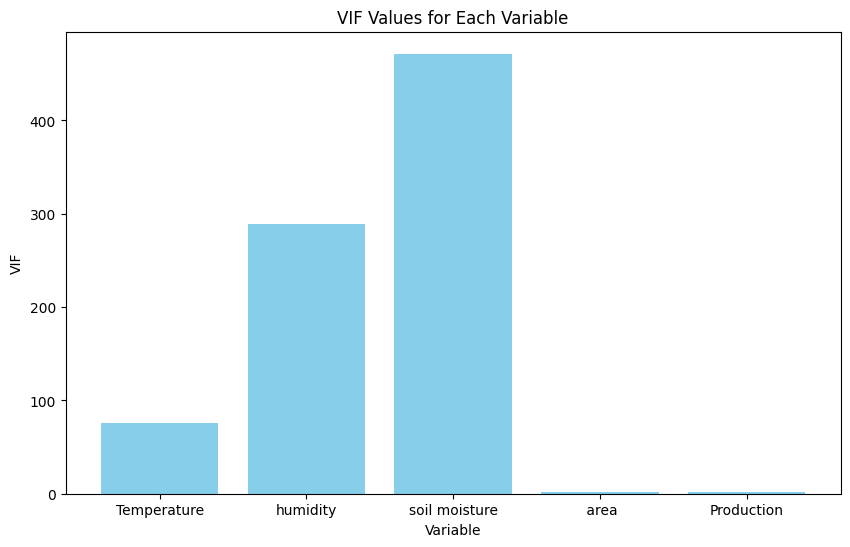

In [13]:
# Plotting
plt.figure(figsize=(10, 6))
plt.bar(vif_result["Variable"], vif_result["VIF"], color='skyblue')
plt.xlabel("Variable")
plt.ylabel("VIF")
plt.title("VIF Values for Each Variable")
plt.show()

In [14]:
# Select only quantitative columns for VIF calculation
data_quant = data_no_outliers[Quant_Columns1]

def drop_high_vif_variables(data_frame, vif_threshold=5):
    variables_dropped = True

    while variables_dropped:
        variables_dropped = False
        vif_data = pd.DataFrame()
        vif_data["Variable"] = data_frame.columns
        vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]

        # Check if any variable has VIF above the threshold
        high_vif_variables = vif_data[vif_data["VIF"] > vif_threshold]

        if not high_vif_variables.empty:
            # Drop the variable with the highest VIF
            variable_to_drop = high_vif_variables.loc[high_vif_variables["VIF"].idxmax()]["Variable"]
            data_frame = data_frame.drop(columns=variable_to_drop)
            print(f"Dropped variable '{variable_to_drop}' with VIF {high_vif_variables['VIF'].max()}")
            variables_dropped = True

    return data_frame

# Drop variables with high VIF
data_no_multicollinearity = drop_high_vif_variables(data_quant)

# Print the cleaned DataFrame
print("DataFrame after dropping variables with high VIF:")
print(data_no_multicollinearity)

Dropped variable 'soil moisture' with VIF 471.45976276825604
Dropped variable 'Temperature' with VIF 40.11725844318173
DataFrame after dropping variables with high VIF:
       humidity    area  Production
0            35  1254.0      2000.0
1            40     2.0         1.0
2            41   102.0       321.0
3            42   176.0       641.0
4            40   720.0       165.0
...         ...     ...         ...
49994        35    27.0         7.0
49995        40    27.0        32.0
49996        41   450.0       213.0
49997        42  1778.0       309.0
49998        40   216.0       194.0

[34775 rows x 3 columns]


In [15]:
# Select only qualitative columns from the original data DataFrame
data_quali = data_no_outliers[Qual_Columns]

# Concatenate data_1_no_multicollinearity with data_quali along the columns
data_no_multi_combined = pd.concat([data_no_multicollinearity, data_quali], axis=1)

In [16]:
data_no_multi_combined.head(3)

,humidity,area,Production,State_Name,District_Name,Season,Crop
0,35,1254.0,2000.0,Andaman and Nicobar Islands,NICOBARS,Kharif,Arecanut
1,40,2.0,1.0,Andaman and Nicobar Islands,NICOBARS,Kharif,Other Kharif pulses
2,41,102.0,321.0,Andaman and Nicobar Islands,NICOBARS,Kharif,Rice


## Data transformation

### 1. One-Hot Encoding:

In [17]:
# Apply one-hot encoding to the qualitative columns
data_encoded_OHE = pd.get_dummies(data_no_multi_combined, columns=Qual_Columns)

# Print the DataFrame after one-hot encoding
print("DataFrame after one-hot encoding:")
print(data_encoded_OHE.head())

DataFrame after one-hot encoding:
   humidity    area  Production  State_Name_Andaman and Nicobar Islands  \
0        35  1254.0      2000.0                                       1   
1        40     2.0         1.0                                       1   
2        41   102.0       321.0                                       1   
3        42   176.0       641.0                                       1   
4        40   720.0       165.0                                       1   

   State_Name_Andhra Pradesh  State_Name_Arunachal Pradesh  State_Name_Assam  \
0                          0                             0                 0   
1                          0                             0                 0   
2                          0                             0                 0   
3                          0                             0                 0   
4                          0                             0                 0   

   State_Name_Bihar  State_Name_Ch

### 2. Label Encoding:

In [18]:
# Apply label encoding to the qualitative columns
data_encoded_LE = data_no_multi_combined.copy()  # Make a copy to avoid modifying the original DataFrame

label_encoder = LabelEncoder()
for column in Qual_Columns:
    data_encoded_LE[column] = label_encoder.fit_transform(data_encoded_LE[column])

# Print the DataFrame after label encoding
print("DataFrame after label encoding:")
print(data_encoded_LE.head())

DataFrame after label encoding:
   humidity    area  Production  State_Name  District_Name  Season  Crop
0        35  1254.0      2000.0           0             78       1     0
1        40     2.0         1.0           0             78       1    46
2        41   102.0       321.0           0             78       1    59
3        42   176.0       641.0           0             78       4     3
4        40   720.0       165.0           0             78       4    12


### 3. Ordinal Encoding:

In [ ]:
# Define a mapping of ordinal values
season_mapping = {'Kharif': 1, 'Autumn': 2, 'Winter': 3, 'Rabi': 4, 'Summer': 5, 'Whole Year': 6}

# Apply ordinal encoding to the 'Season' column
data_no_multi_combined['Season'] = data_no_multi_combined['Season'].map(season_mapping)

# Print the DataFrame after ordinal encoding
print("DataFrame after ordinal encoding:")
print(data_no_multi_combined.head())

### 4. Frequency Encoding:

In [19]:
# Apply Frequency Encoding to the qualitative columns
data_encoded_FE = data_no_multi_combined.copy()

# Apply frequency encoding to the qualitative columns
for column in Qual_Columns:
    freq_encoding = data_encoded_FE[column].value_counts(normalize=True).to_dict()
    data_encoded_FE[column + '_freq_encoded'] = data_encoded_FE[column].map(freq_encoding)

# Drop the original qualitative columns
data_encoded_FE = data_encoded_FE.drop(columns=Qual_Columns)

# Print the DataFrame after frequency encoding
print("DataFrame after frequency encoding:")
print(data_encoded_FE.head())

DataFrame after frequency encoding:
   humidity    area  Production  State_Name_freq_encoded  \
0        35  1254.0      2000.0                 0.004428   
1        40     2.0         1.0                 0.004428   
2        41   102.0       321.0                 0.004428   
3        42   176.0       641.0                 0.004428   
4        40   720.0       165.0                 0.004428   

   District_Name_freq_encoded  Season_freq_encoded  Crop_freq_encoded  
0                    0.001754             0.369173           0.011646  
1                    0.001754             0.369173           0.013947  
2                    0.001754             0.369173           0.026945  
3                    0.001754             0.256506           0.010726  
4                    0.001754             0.256506           0.002789  


### 5. Target Encoding:

In [20]:
# Apply Frequency Encoding to the qualitative columns
data_encoded_TE = data_no_multi_combined.copy()

# Apply target encoding to the qualitative columns
for column in Qual_Columns:
    target_encoding = data_encoded_TE.groupby(column)['Production'].mean().to_dict()
    data_encoded_TE[column + '_target_encoded'] = data_encoded_TE[column].map(target_encoding)

# Drop the original qualitative columns
data_encoded_TE = data_encoded_TE.drop(columns=Qual_Columns)

# Print the DataFrame after target encoding
print("DataFrame after target encoding:")
print(data_encoded_TE.head())

DataFrame after target encoding:
   humidity    area  Production  State_Name_target_encoded  \
0        35  1254.0      2000.0                1181.207532   
1        40     2.0         1.0                1181.207532   
2        41   102.0       321.0                1181.207532   
3        42   176.0       641.0                1181.207532   
4        40   720.0       165.0                1181.207532   

   District_Name_target_encoded  Season_target_encoded  Crop_target_encoded  
0                    400.377377             874.358047          2174.304222  
1                    400.377377             874.358047           177.934021  
2                    400.377377             874.358047          2591.807812  
3                    400.377377            1662.249105          4713.686649  
4                    400.377377            1662.249105            85.006701  


## Spliting Data

In [21]:
# Specify your features (X) and target variable (y)
X = data_encoded_FE.drop(columns=['Production'])  # Features
y = data_encoded_FE['Production']  # Target variable

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Print the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (24342, 6)
X_test shape: (10433, 6)
y_train shape: (24342,)
y_test shape: (10433,)


## Scaling data

In [22]:
# Compute mean, std, min and max values for each column in data
min_values = X_train.min()
max_values = X_train.max()
mean_values = X_train.mean()
std_values = X_train.std()

### Min-Max

In [23]:
# Min-Max Scaling for X_train
X_train_mm = (X_train - min_values) / (max_values - min_values)
# Apply the same scaling to X_test
X_test_mm = (X_test - min_values) / (max_values - min_values)

### Standardization

In [24]:
# Standardization Scaling for X_train
X_train_std = (X_train - mean_values) / std_values
# Apply the same scaling to X_test
X_test_std = (X_test - mean_values) / std_values

## Feature selection

In [25]:
# Use SelectKBest with f_regression (for regression problems)
k_best = 5  # Number of top features to select
selector = SelectKBest(f_regression, k=k_best)

# Fit the selector on the training data
X_train_selected = selector.fit_transform(X_train_std, y_train_std)

# Get the selected feature indices
selected_indices = selector.get_support(indices=True)
# Get the names of the selected features
selected_features = X_train_std.columns[selected_indices]
# Print the names of the selected features
print(f"Selected Features: {selected_features}")

Selected Features: Index([' area', 'State_Name_freq_encoded', 'District_Name_freq_encoded',
       'Season_freq_encoded', 'Crop_freq_encoded'],
      dtype='object')


In [26]:
X_train = X_train_std[selected_features]
X_test = X_test_std[selected_features]

# Modeling

## Training Models

In [27]:
# Linear Regression
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
print(linear_reg.coef_)
print(linear_reg.intercept_)

[1214.14198752  -12.10324137   36.24101215 -314.63082952 -167.4519795 ]
1252.8458417549912


In [28]:
# Lasso Regression
lasso_reg = Lasso(alpha=0.1)
lasso_reg.fit(X_train, y_train)
print(lasso_reg.coef_)
print(lasso_reg.intercept_)

[1214.05085978  -11.973387     36.11087596 -314.50694472 -167.34811321]
1252.8458417549912


In [29]:
# Ridge Regression
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)
print(ridge_reg.coef_)
print(ridge_reg.intercept_)

[1214.09172111  -12.10410289   36.24095188 -314.62170887 -167.43916002]
1252.8458417549912


In [30]:
# Decision Tree Regression
decision_tree_reg = DecisionTreeRegressor(max_depth=5, random_state=42)
decision_tree_reg.fit(X_train, y_train)
print(decision_tree_reg.feature_importances_)

[0.56675487 0.01879936 0.00619768 0.05653174 0.35171635]


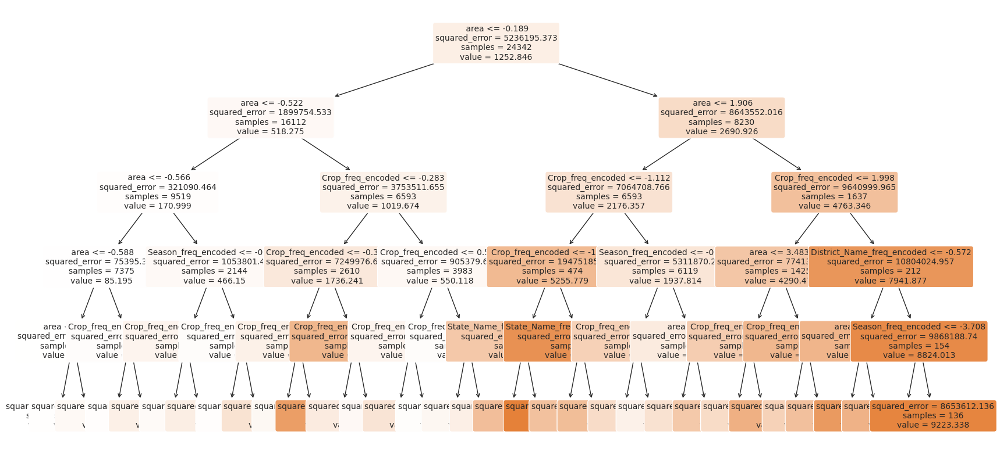

In [ ]:
# Set up the figure and adjust size as needed
plt.figure(figsize=(20, 10))

# Plot the decision tree
plot_tree(decision_tree_reg,
          filled=True,            # Fill nodes with color
          feature_names=X_train.columns, # Use feature names for clarity
          class_names=True,        # Show class names for classification trees
          rounded=True,           # Round the nodes
          fontsize=10)            # Adjust font size as needed

# Display the plot

plt.savefig('dt_5trees.png')
plt.show()

In [31]:
# Random Forest Regression
random_forest_reg = RandomForestRegressor(random_state=42)
random_forest_reg.fit(X_train, y_train)
print(random_forest_reg.feature_importances_)

[0.44445881 0.06303602 0.06673354 0.07675952 0.34901211]


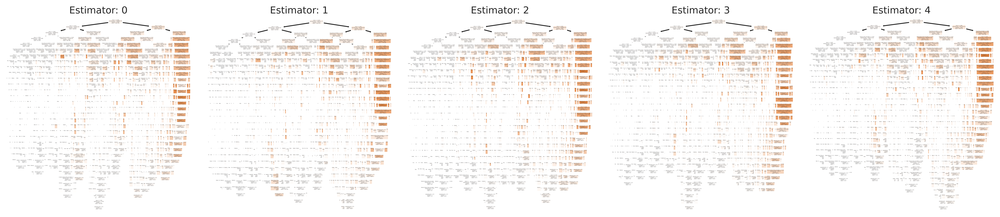

In [ ]:
# Extract the names of the features and target variable
feature_names = X_train.columns
class_names = ['Production']

# Assuming random_forest_reg is your trained Random Forest model
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), dpi=900)

for index in range(0, 5):
    tree.plot_tree(random_forest_reg.estimators_[index],
                   feature_names=feature_names,
                   class_names=class_names,
                   filled=True,
                   ax=axes[index])

    axes[index].set_title('Estimator: ' + str(index), fontsize=11)

fig.savefig('rf_5trees.png')
plt.show()

In [32]:
# Support Vector Regression
svr_reg = SVR(kernel='linear')
svr_reg.fit(X_train, y_train)
print(svr_reg.coef_)

[[997.50892089   4.0246     -10.04641704 -49.2357896   -8.96788754]]


In [33]:
# Bayesian Linear Regression
bayesian_reg = BayesianRidge()
bayesian_reg.fit(X_train, y_train)
print(bayesian_reg.coef_)

[1213.57613889  -12.11292589   36.24032121 -314.52813886 -167.30769777]


# Evaluation

In [34]:
linear_reg_predictions = linear_reg.predict(X_test)
lasso_reg_predictions = lasso_reg.predict(X_test)
ridge_reg_predictions = ridge_reg.predict(X_test)
decision_tree_reg_predictions = decision_tree_reg.predict(X_test)
random_forest_reg_predictions = random_forest_reg.predict(X_test)
svr_reg_predictions = svr_reg.predict(X_test)
bayesian_reg_predictions = bayesian_reg.predict(X_test)

Linear Regression - Mean Squared Error: 3661781.9991029263
Lasso Regression - Mean Squared Error: 3661783.427056796
Ridge Regression - Mean Squared Error: 3661785.7353186053
Decision Tree Regression - Mean Squared Error: 2432289.4675874645
Random Forest Regression - Mean Squared Error: 770791.641466282
Support Vector Regression - Mean Squared Error: 4224866.46451239
Bayesian Linear Regression - Mean Squared Error: 3661824.38241423


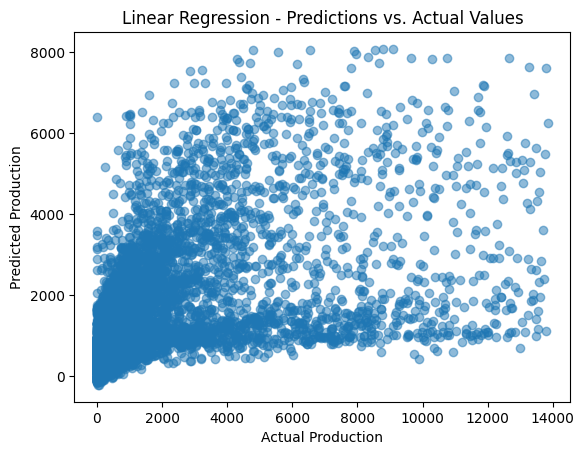

In [35]:
# Evaluate the models
models = {
    'Linear Regression': linear_reg_predictions,
    'Lasso Regression': lasso_reg_predictions,
    'Ridge Regression': ridge_reg_predictions,
    'Decision Tree Regression': decision_tree_reg_predictions,
    'Random Forest Regression': random_forest_reg_predictions,
    'Support Vector Regression': svr_reg_predictions,
    'Bayesian Linear Regression': bayesian_reg_predictions,
}

for model_name, predictions in models.items():
    mse = mean_squared_error(y_test, predictions)
    print(f"{model_name} - Mean Squared Error: {mse}")

# Plot predictions vs. actual values for one model (e.g., Linear Regression)
plt.scatter(y_test, linear_reg_predictions, alpha=0.5)
plt.xlabel("Actual Production")
plt.ylabel("Predicted Production")
plt.title("Linear Regression - Predictions vs. Actual Values")
plt.show()

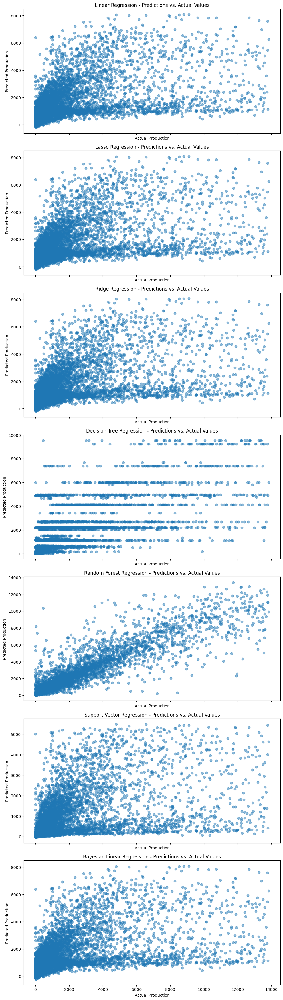

In [36]:
# Assuming y_test is a 1D array or pandas Series
y_test_values = np.array(y_test)

# Create subplots
fig, axs = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)), sharex=True)

# Iterate through models and plot predictions vs. actual values
for i, (model_name, predictions) in enumerate(models.items()):
    axs[i].scatter(y_test_values, predictions, alpha=0.5)
    axs[i].set_xlabel("Actual Production")
    axs[i].set_ylabel("Predicted Production")
    axs[i].set_title(f"{model_name} - Predictions vs. Actual Values")

# Adjust layout for better spacing between subplots
plt.tight_layout()
plt.show()